In [1]:
# Install OpenCV if not already installed
!pip install opencv-python-headless


In [2]:
# Import libraries
import cv2
import numpy as np
import os
from google.colab import drive  # Import drive to mount Google Drive
# Mount Google Drive
drive.mount('/content/drive')


Mounted at /content/drive


In [3]:
image_folder = '/content/drive/MyDrive/Colab Notebooks/Football/Drop 1'

In [4]:
# List to store image file names (assuming sequential names like frame1.bmp, frame2.bmp, etc.)
image_files = sorted([os.path.join(image_folder, f) for f in os.listdir(image_folder) if f.endswith('.bmp')])
if not image_files:
    raise ValueError(f"No .bmp files found in {image_folder}. Please check the folder path and ensure .bmp files exist.")

# Read the first image to initialize
frame = cv2.imread(image_files[0], cv2.IMREAD_GRAYSCALE)
if frame is None:
    raise ValueError(f"Failed to load the first image: {image_files[0]}")


In [5]:
# Preprocess the first frame
_, thresh = cv2.threshold(frame, 50, 255, cv2.THRESH_BINARY_INV)

# Find contours to get initial object position
contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
if contours:
    largest_contour = max(contours, key=cv2.contourArea)
    M = cv2.moments(largest_contour)
    if M["m00"] != 0:
        cx = int(M["m10"] / M["m00"])
        cy = int(M["m01"] / M["m00"])
    else:
        cx, cy = frame.shape[1] // 2, frame.shape[0] // 2  # Default center if no contour
else:
    cx, cy = frame.shape[1] // 2, frame.shape[0] // 2

# Initialize Kalman Filter (4 states: x, y, dx, dy; 2 measurements: x, y)
kalman = cv2.KalmanFilter(4, 2)
kalman.measurementMatrix = np.array([[1, 0, 0, 0], [0, 1, 0, 0]], np.float32)
kalman.transitionMatrix = np.array([[1, 0, 1, 0], [0, 1, 0, 1], [0, 0, 1, 0], [0, 0, 0, 1]], np.float32)
kalman.processNoiseCov = np.eye(4, dtype=np.float32) * 0.03
kalman.statePre = np.array([[cx], [cy], [0], [0]], np.float32)  # Initial state


In [6]:
# Apply Canny edge detection to find the surface line
edges = cv2.Canny(frame, 50, 150, apertureSize=3)

# Use Hough Transform to detect lines
lines = cv2.HoughLinesP(edges, 1, np.pi / 180, threshold=100, minLineLength=100, maxLineGap=10)

# Find the horizontal line closest to the bottom (assuming it's the surface)
surface_y = frame.shape[0]  # Default to bottom if no line is found
if lines is not None:
    for line in lines:
        x1, y1, x2, y2 = line[0]
        if abs(y1 - y2) < 10:  # Horizontal line (small y difference)
            surface_y = min(y1, y2)  # Take the lowest y as the surface
            break

print(f"Detected surface at y = {surface_y}")


Detected surface at y = 446


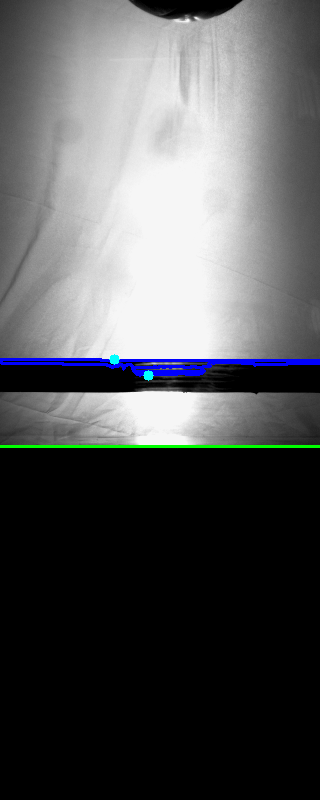

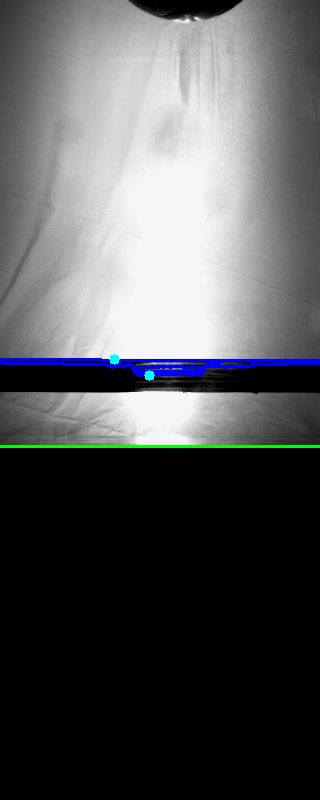

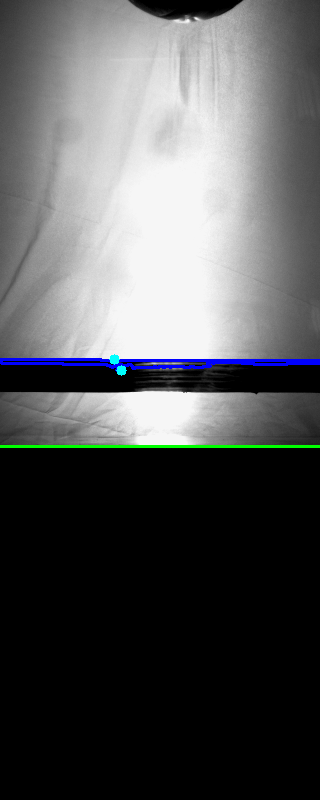

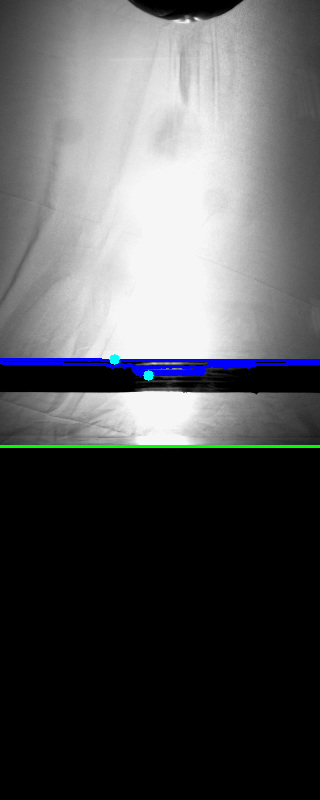

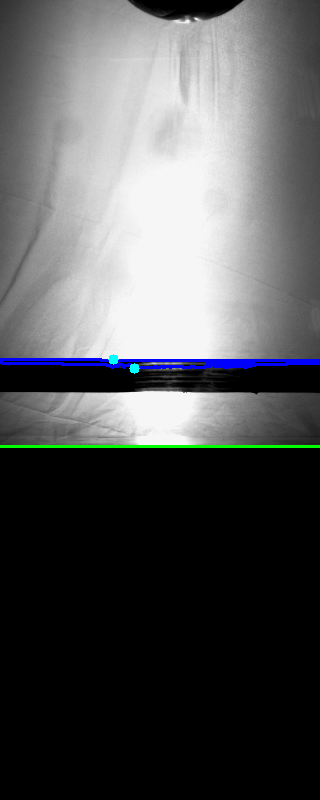

...

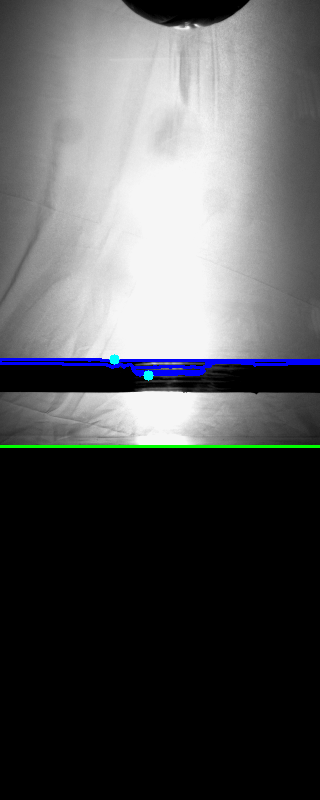

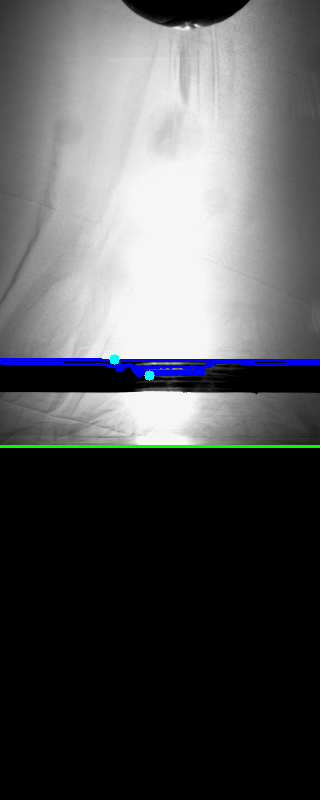

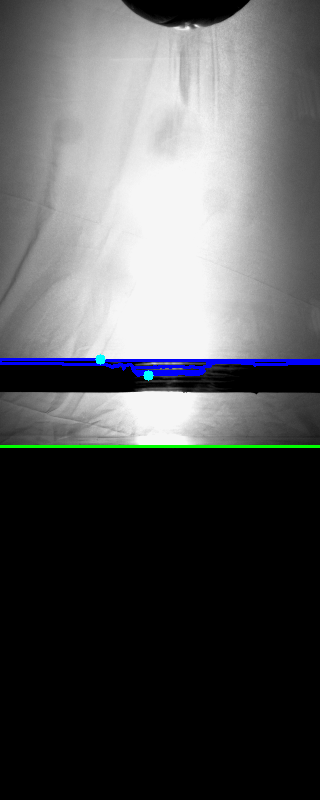

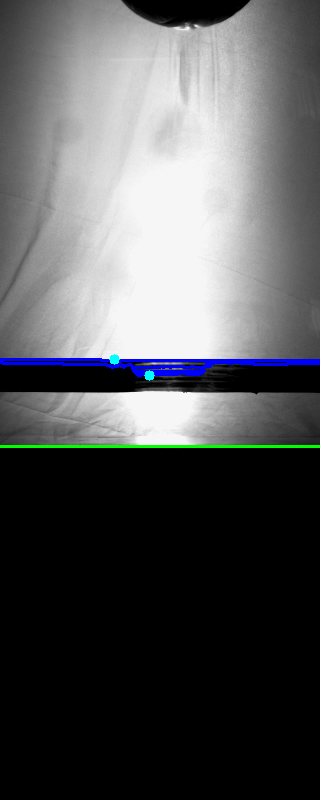

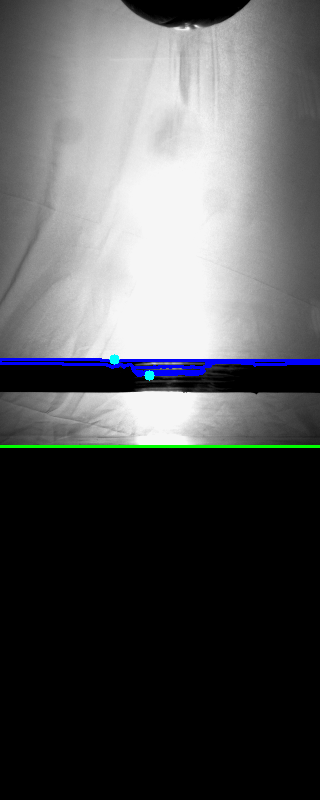

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

# Initialize CSV data storage
data_records = []

# Kalman Filter Setup
kalman = cv2.KalmanFilter(4, 2)
kalman.measurementMatrix = np.array([[1, 0, 0, 0], [0, 1, 0, 0]], np.float32)
kalman.transitionMatrix = np.array([[1, 0, 1, 0], [0, 1, 0, 1], [0, 0, 1, 0], [0, 0, 0, 1]], np.float32)
kalman.processNoiseCov = np.eye(4, dtype=np.float32) * 0.03
kalman.statePre = np.array([[0], [0], [0], [0]], np.float32)

# Initialize previous frame for optical flow
prev_gray = cv2.cvtColor(cv2.imread(image_files[0]), cv2.COLOR_BGR2GRAY)
p0 = np.array([[[0, 0]]], dtype=np.float32)  # Initial point for optical flow

lk_params = dict(winSize=(15, 15), maxLevel=2, criteria=(cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))

# Store the original ball diameter (from first frames without contact)
D_original = None

# Initialize last valid position for Kalman constraint
last_valid_cx, last_valid_cy = None, None

# Define minimum ball size (in pixels) to filter out noise
min_ball_size = 50  # Adjust based on image resolution and ball size

# Process each image
for i, img_file in enumerate(image_files):
    # Read and preprocess current frame
    frame = cv2.imread(img_file, cv2.IMREAD_GRAYSCALE)
    if frame is None:
        print(f"Failed to load {img_file}")
        continue

    # Apply adaptive thresholding for better contrast
    blurred = cv2.GaussianBlur(frame, (5, 5), 0)
    thresh = cv2.adaptiveThreshold(blurred, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2)

    # Find contours
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    cx, cy = None, None
    largest_contour = None
    contact_length = 0
    aspect_ratio = 0
    diameter = 0
    deformation_length = 0

    if contours:
        filtered_contours = [cnt for cnt in contours if cv2.contourArea(cnt) > min_ball_size]

        if filtered_contours:
            # Select the most circular contour (assumed to be the ball)
            largest_contour = max(filtered_contours, key=lambda c: cv2.arcLength(c, True))

            # Compute center of mass
            M = cv2.moments(largest_contour)
            if M["m00"] != 0:
                cx = int(M["m10"] / M["m00"])
                cy = int(M["m01"] / M["m00"])
                kalman.correct(np.array([[np.float32(cx)], [np.float32(cy)]]))

    # Kalman prediction only if detection fails
    pred_cx, pred_cy = None, None
    if cx is None or cy is None:
        prediction = kalman.predict()
        pred_cx, pred_cy = int(prediction[0]), int(prediction[1])
        # Limit prediction range (e.g., within 50 pixels of last valid position)
        if last_valid_cx is not None and last_valid_cy is not None:
            max_displacement = 50
            if (abs(pred_cx - last_valid_cx) > max_displacement or
                abs(pred_cy - last_valid_cy) > max_displacement):
                pred_cx, pred_cy = last_valid_cx, last_valid_cy
        cx, cy = pred_cx, pred_cy
    else:
        last_valid_cx, last_valid_cy = cx, cy  # Update last valid position

    # Optical flow tracking (only if no actual detection)
    curr_gray = frame
    if cx is None or cy is None:
        p1, st, err = cv2.calcOpticalFlowPyrLK(prev_gray, curr_gray, p0, None, **lk_params)
        if p1 is not None and st[0] == 1:
            flow_cx, flow_cy = p1[0][0], p1[0][1]
            cx, cy = int(flow_cx), int(flow_cy)

    p0 = np.array([[[cx, cy]]], dtype=np.float32)  # Update optical flow point

    # Convert frame to color for drawing
    frame_color = cv2.cvtColor(frame, cv2.COLOR_GRAY2BGR)

    if largest_contour is not None:
        # Draw the contour around the ball (🔵 Blue)
        cv2.drawContours(frame_color, [largest_contour], -1, (255, 0, 0), 2)

        # Get the actual top and bottom points from the contour
        hull = cv2.convexHull(largest_contour)
        top_point = tuple(hull[hull[:, :, 1].argmin()][0])  # Topmost point
        bottom_point = tuple(hull[hull[:, :, 1].argmax()][0])  # Bottommost point

        # Draw Top & Bottom Dots for Diameter (🔵 Cyan)
        cv2.circle(frame_color, top_point, 5, (255, 255, 0), -1)
        cv2.circle(frame_color, bottom_point, 5, (255, 255, 0), -1)

        # Calculate diameter
        diameter = bottom_point[1] - top_point[1]

        # Store the original diameter when ball is **not** touching the surface
        if D_original is None and bottom_point[1] < surface_y:
            D_original = diameter

        # Detect contact and calculate deformation
        if bottom_point[1] >= surface_y:
            print(f"Contact detected at frame {i + 1} ({img_file})")

            # Find contour points near the surface
            contact_points = largest_contour[np.abs(largest_contour[:, 0, 1] - surface_y) <= 2]

            if len(contact_points) > 0:
                # Use convex hull for better accuracy
                hull = cv2.convexHull(contact_points)
                contact_x_min = np.min(hull[:, 0, 0])
                contact_x_max = np.max(hull[:, 0, 0])
                contact_length = contact_x_max - contact_x_min

                # Draw Contact Length (🟡 Yellow)
                cv2.line(frame_color, (contact_x_min, surface_y), (contact_x_max, surface_y), (0, 255, 255), 3)

                # Calculate deformation length
                if D_original is not None and contact_length > 0.9 * D_original:
                    deformation_length = max(0, contact_length - D_original)

    # Draw Surface Line (🟢 Green)
    cv2.line(frame_color, (0, surface_y), (frame.shape[1], surface_y), (0, 255, 0), 2)

    # Draw Kalman Prediction Dot (🔴 Red) only if used
    if pred_cx is not None and pred_cy is not None:
        cv2.circle(frame_color, (pred_cx, pred_cy), 5, (0, 0, 255), -1)

    # Save data to CSV
    data_records.append([i + 1, cx, cy, contact_length, aspect_ratio, diameter, deformation_length])

    # Display frame
    cv2_imshow(frame_color)
    if cv2.waitKey(30) & 0xFF == ord('q'):
        break

    # Update previous frame for optical flow
    prev_gray = curr_gray.copy()

cv2.destroyAllWindows()

## GROK

Detected surface at y = 446
Frame 1451: Diameter = 174 pixels


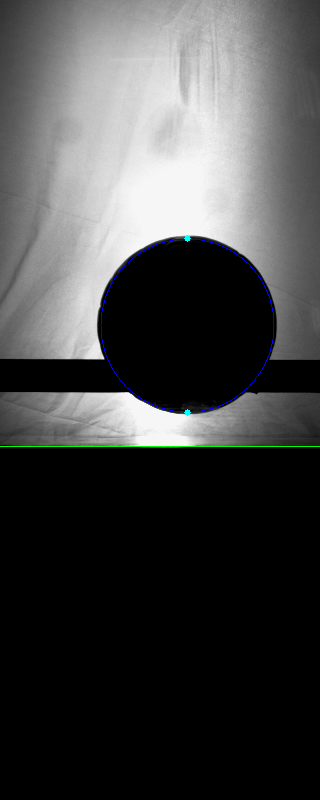

Frame 1452: Diameter = 174 pixels


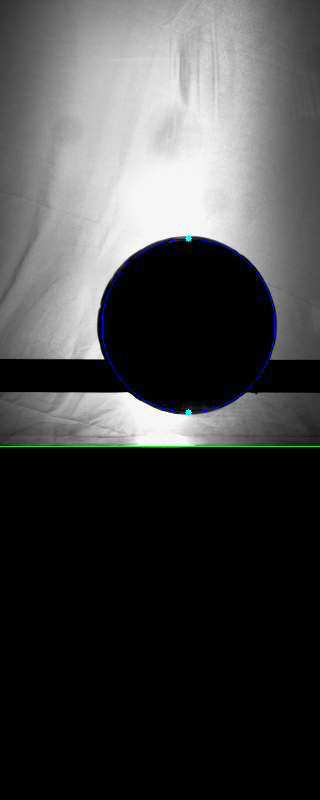

Frame 1453: Diameter = 174 pixels


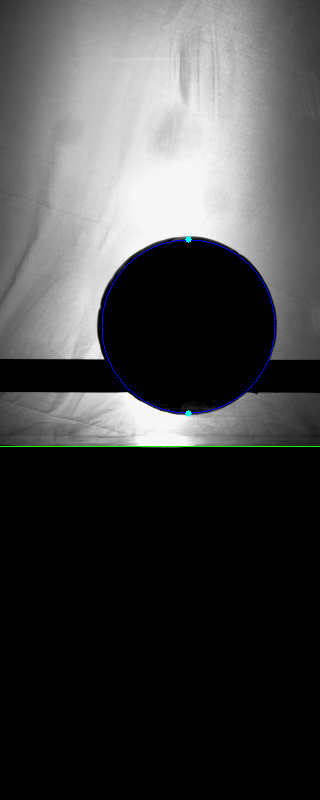

Frame 1454: Diameter = 174 pixels


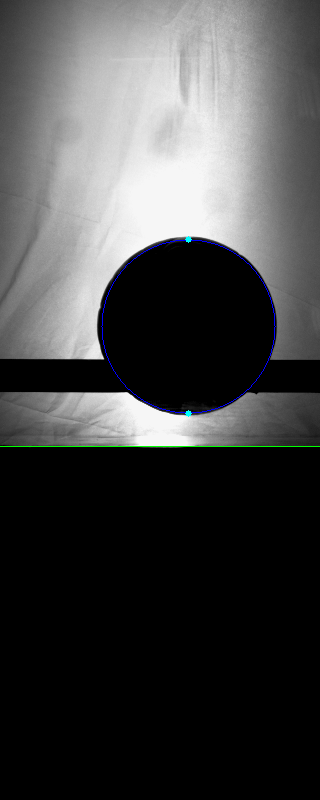

Frame 1455: Diameter = 174 pixels


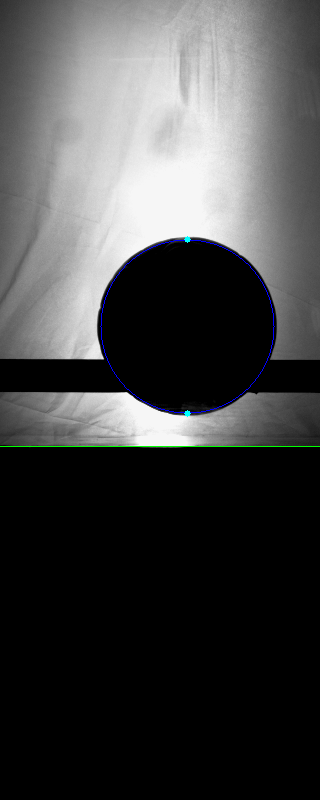

Frame 1456: Diameter = 174 pixels


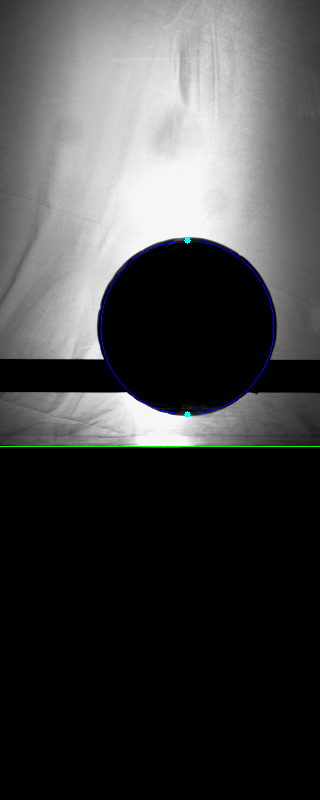

Frame 1457: Diameter = 174 pixels


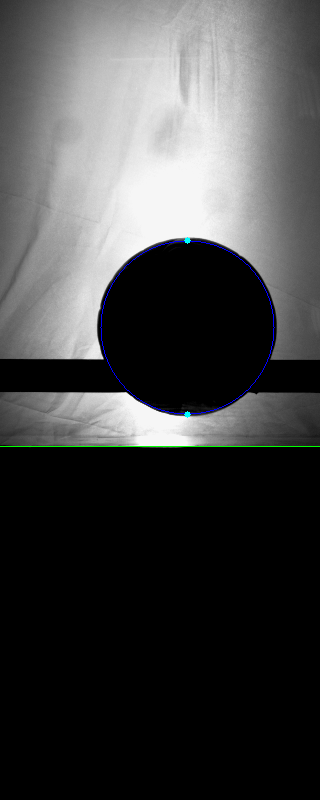

Frame 1458: Diameter = 174 pixels


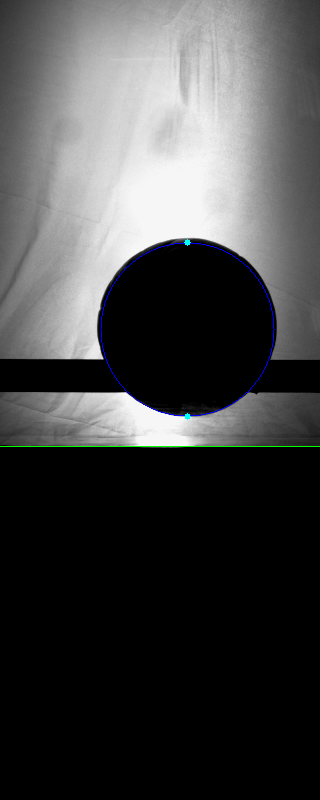

Frame 1459: Diameter = 174 pixels


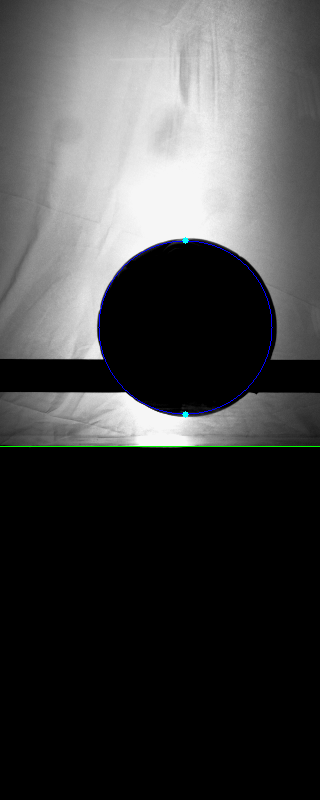

Frame 1460: Diameter = 174 pixels


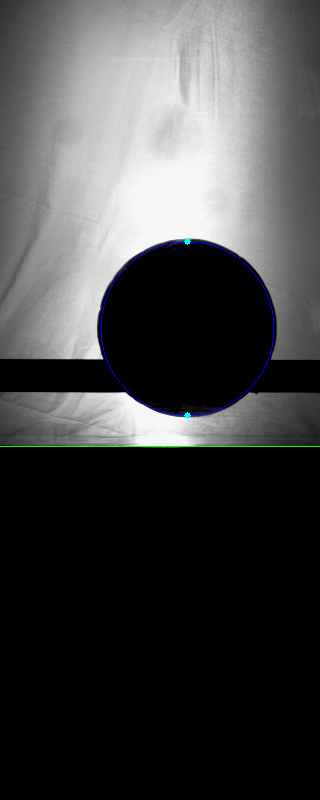

Frame 1461: Diameter = 174 pixels


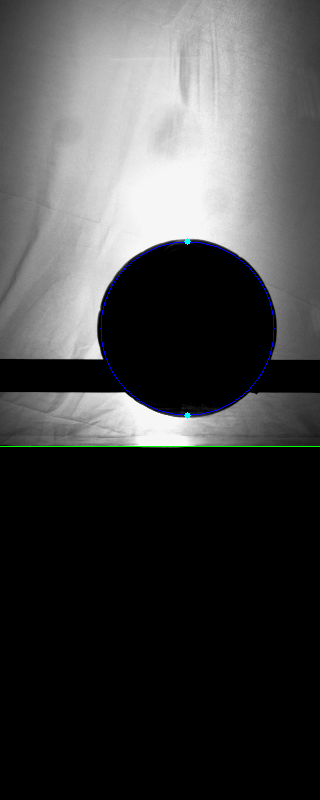

Frame 1462: Diameter = 174 pixels


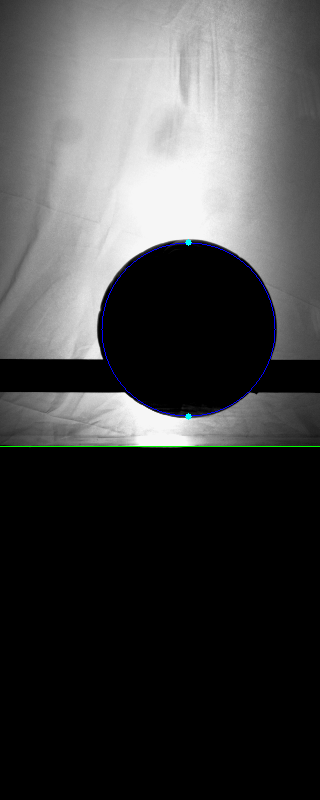

Frame 1463: Diameter = 174 pixels


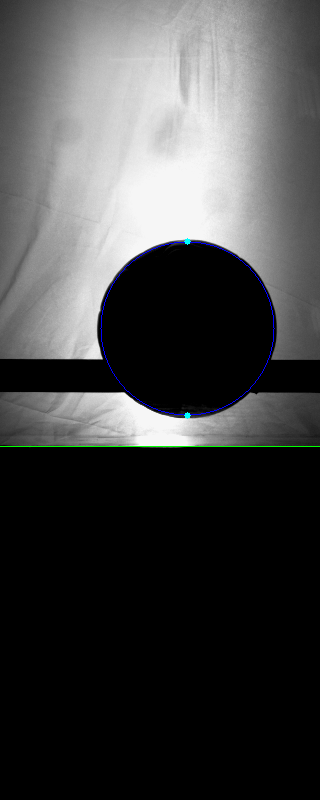

Frame 1464: Diameter = 174 pixels


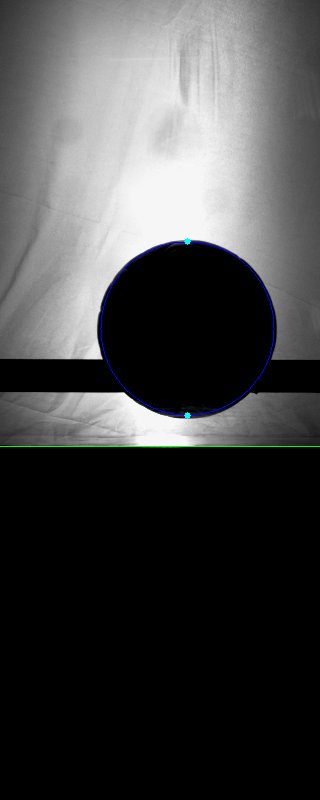

Frame 1465: Diameter = 174 pixels


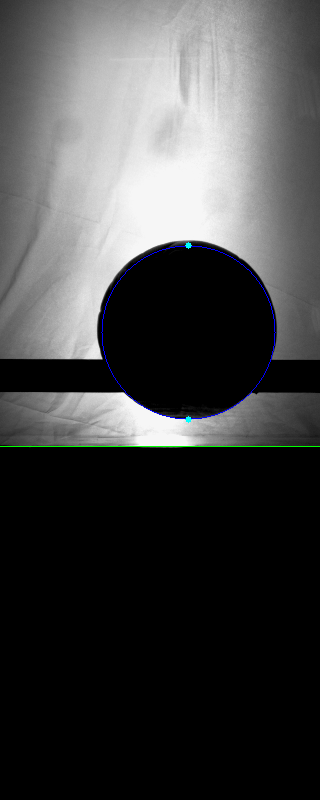

Frame 1466: Diameter = 174 pixels


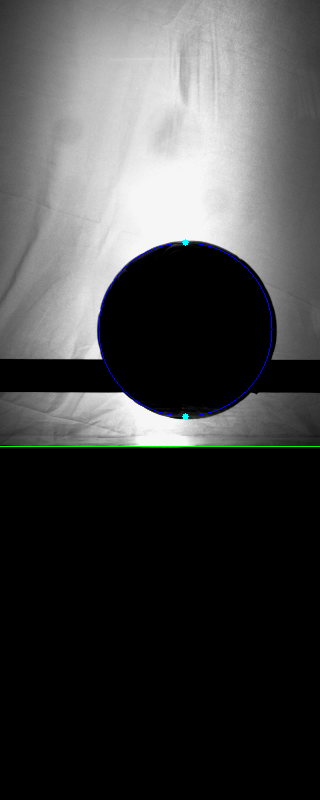

Frame 1467: Diameter = 174 pixels


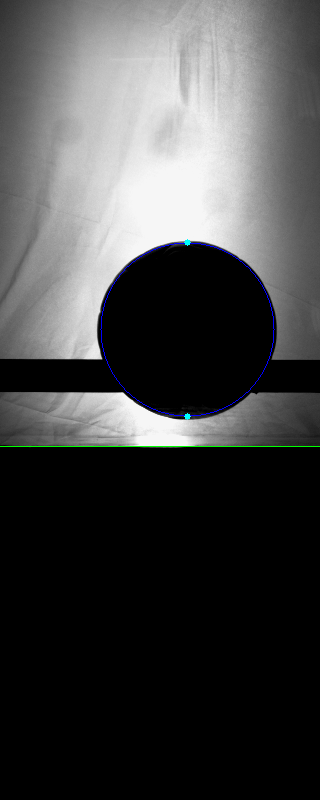

Frame 1468: Diameter = 174 pixels


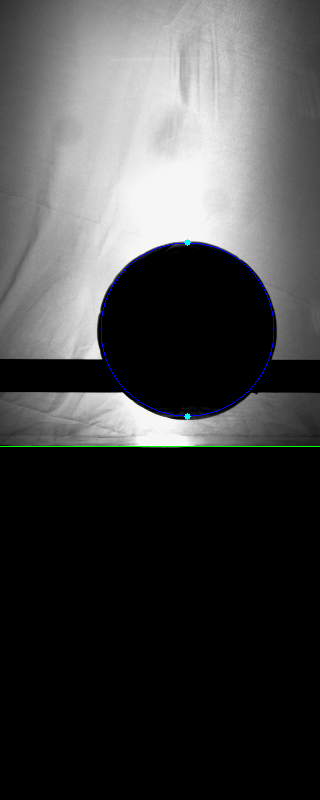

Frame 1469: Diameter = 174 pixels


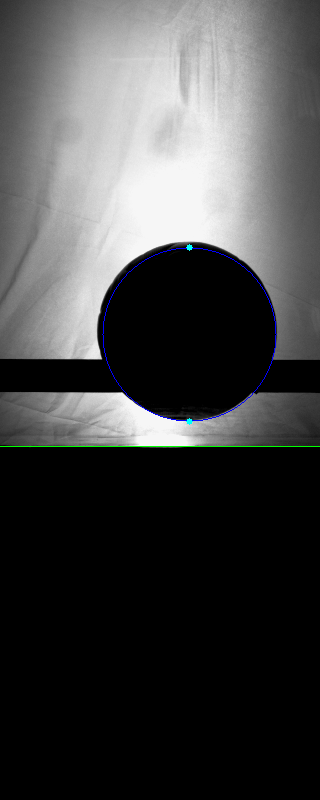

Frame 1470: Diameter = 174 pixels


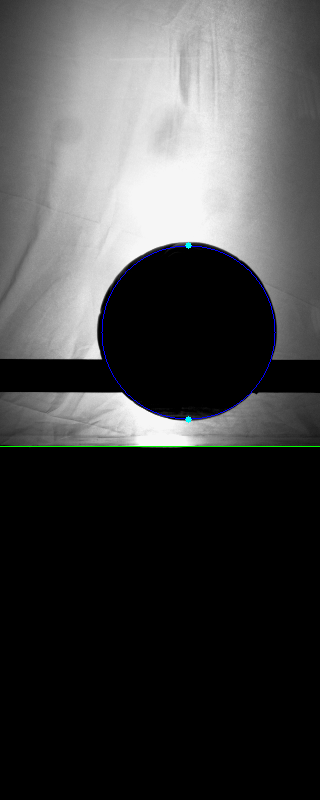

Frame 1471: Diameter = 174 pixels


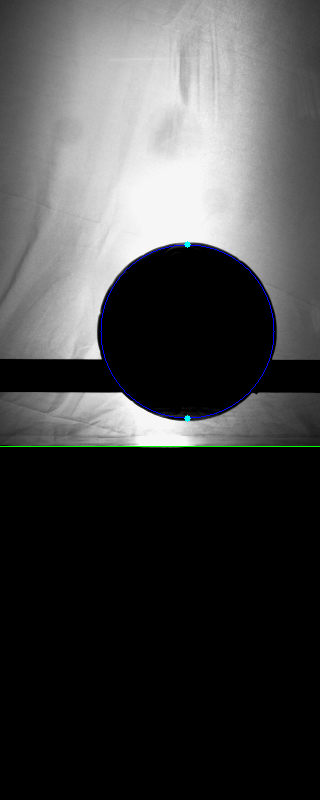

Frame 1472: Diameter = 174 pixels


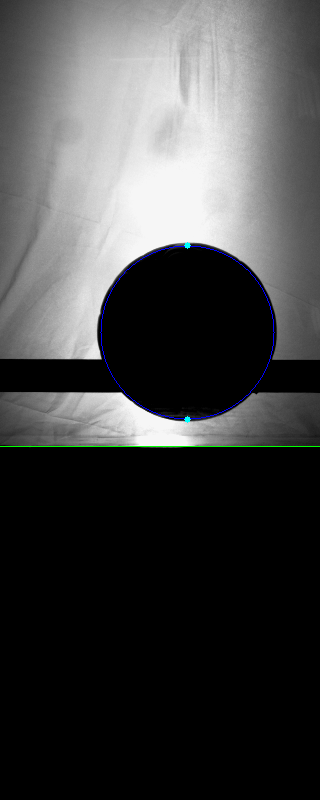

Frame 1473: Diameter = 174 pixels


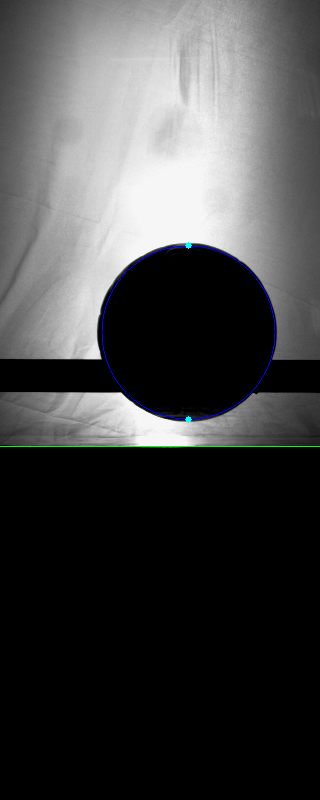

Frame 1474: Diameter = 174 pixels


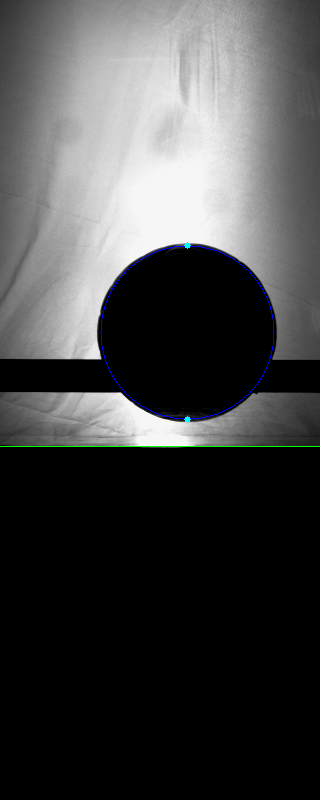

Frame 1475: Diameter = 174 pixels


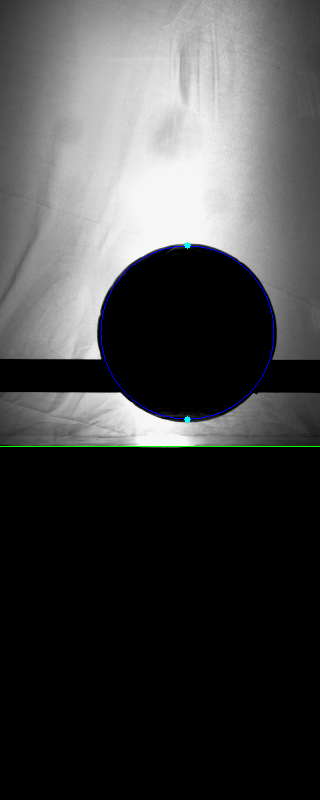

Frame 1476: Diameter = 174 pixels


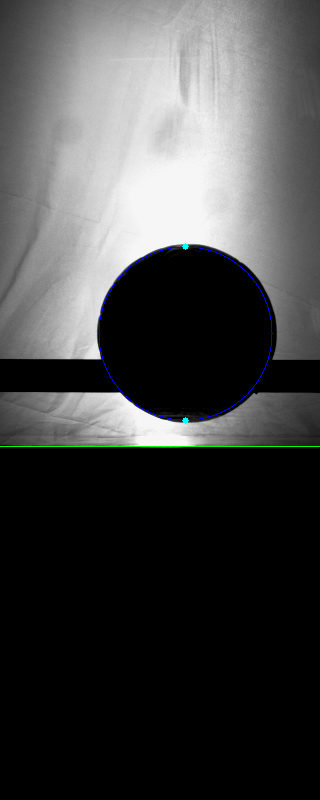

Frame 1477: Diameter = 174 pixels


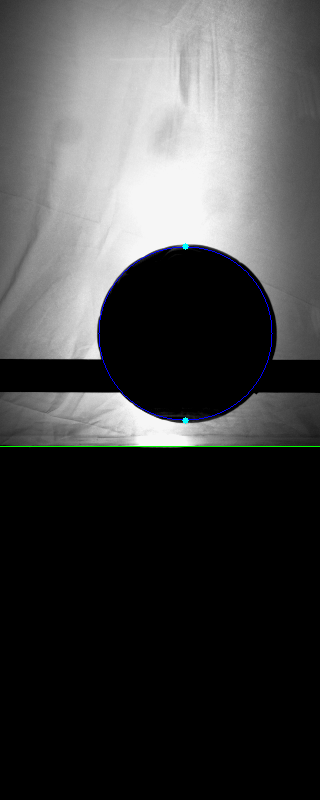

Frame 1478: Diameter = 174 pixels


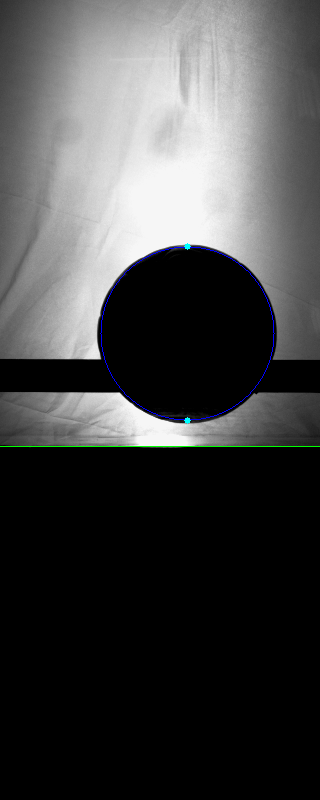

Frame 1479: Diameter = 174 pixels


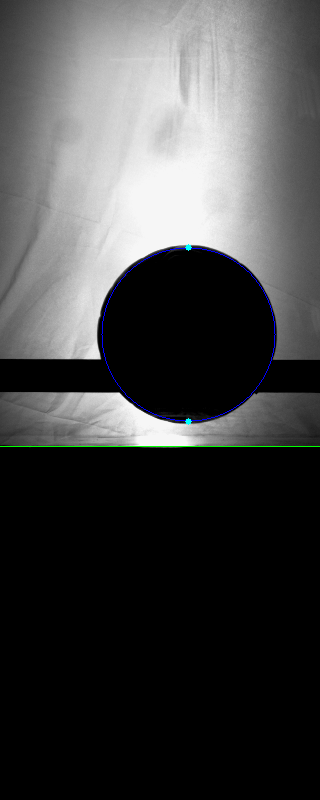

Frame 1480: Diameter = 174 pixels


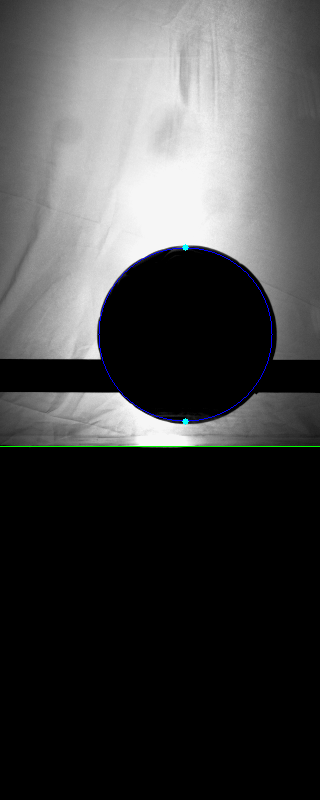

Frame 1481: Diameter = 174 pixels


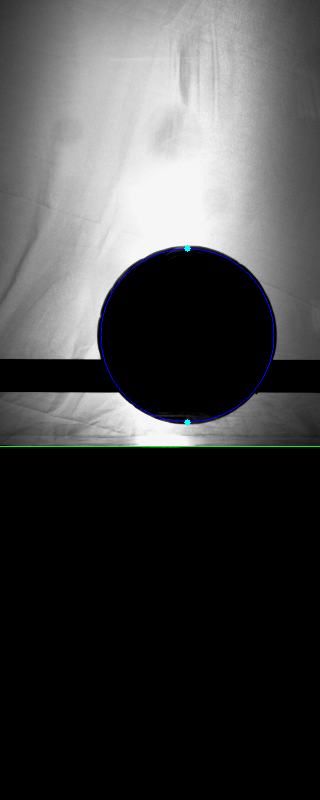

Frame 1482: Diameter = 174 pixels


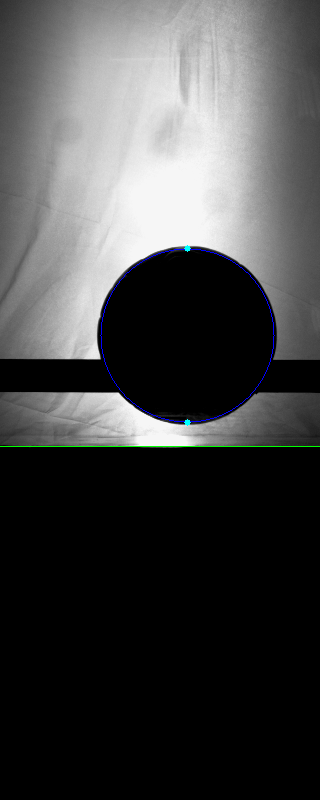

Frame 1483: Diameter = 174 pixels


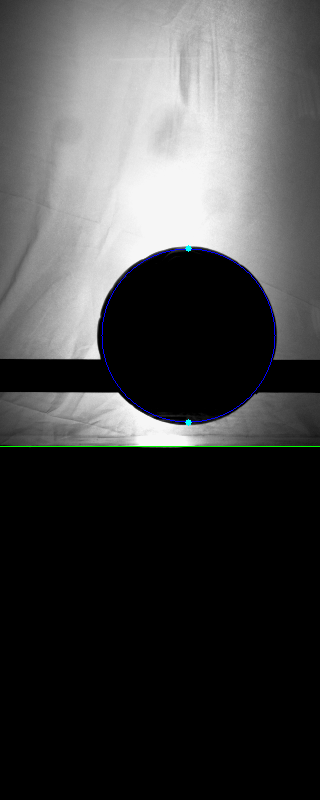

Frame 1484: Diameter = 174 pixels


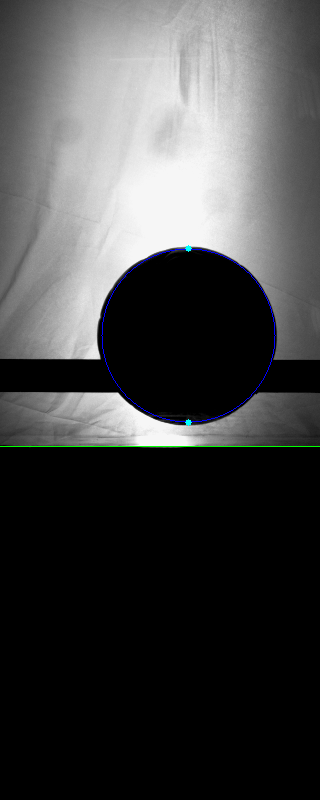

Frame 1485: Diameter = 174 pixels


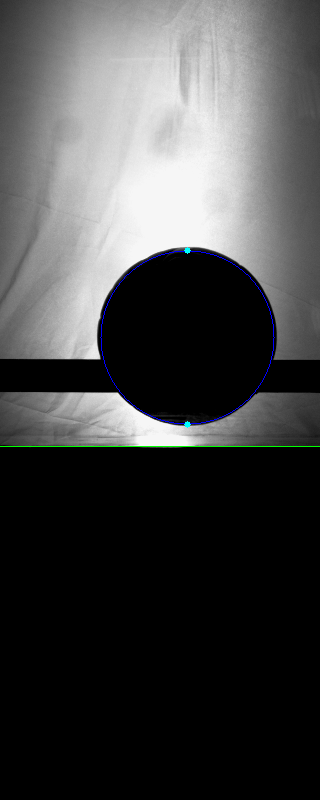

Frame 1486: Diameter = 174 pixels


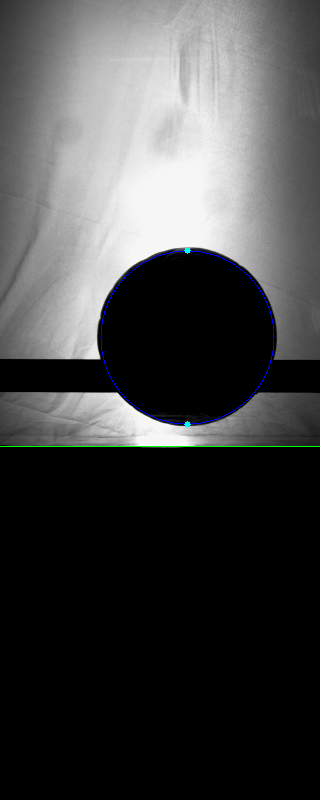

Frame 1487: Diameter = 174 pixels


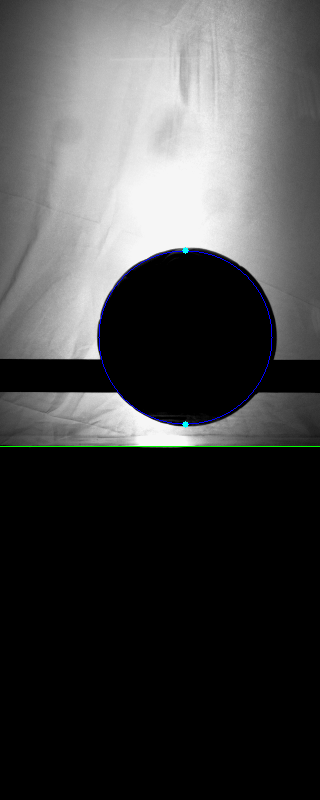

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

# Define image folder and load image files
image_folder = '/content/drive/MyDrive/Colab Notebooks/Football/Drop 1'
image_files = sorted([os.path.join(image_folder, f) for f in os.listdir(image_folder) if f.endswith('.bmp')])
if not image_files:
    raise ValueError(f"No .bmp files found in {image_folder}. Please check the folder path and ensure .bmp files exist.")

# Read the first image to initialize
frame = cv2.imread(image_files[0], cv2.IMREAD_GRAYSCALE)
if frame is None:
    raise ValueError(f"Failed to load the first image: {image_files[0]}")

# Apply Canny edge detection to find the surface line
edges = cv2.Canny(frame, 50, 150, apertureSize=3)

# Use Hough Transform to detect lines
lines = cv2.HoughLinesP(edges, 1, np.pi / 180, threshold=100, minLineLength=100, maxLineGap=10)

# Find the horizontal line closest to the bottom (assuming it's the surface)
surface_y = frame.shape[0]  # Default to bottom if no line is found
if lines is not None:
    for line in lines:
        x1, y1, x2, y2 = line[0]
        if abs(y1 - y2) < 10:  # Horizontal line (small y difference)
            surface_y = min(y1, y2)  # Take the lowest y as the surface
            break

print(f"Detected surface at y = {surface_y}")

# Store initial diameter for deformation tracking
D_original = None

# Initialize CSV data storage
data_records = []

# Circle size scaling factor (adjust this value to change circle size)
circle_scale_factor = 1.0  # Default: 1.0 (original size)

# Process frames 1450 to 1650
start_frame = 1450
end_frame = 1650
for i, img_file in enumerate(image_files):
    if i < start_frame or i >= end_frame:
        continue

    # Read and preprocess current frame
    frame = cv2.imread(img_file, cv2.IMREAD_GRAYSCALE)
    if frame is None:
        print(f"Failed to load {img_file}")
        continue

    # Apply Gaussian blur to reduce noise
    blurred = cv2.GaussianBlur(frame, (5, 5), 0)

    # Apply adaptive thresholding for better contrast
    thresh = cv2.adaptiveThreshold(blurred, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2)

    # Find contours
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    cx, cy, radius = None, None, None
    diameter = 0

    # Use HoughCircles for better detection
    circles = cv2.HoughCircles(frame, cv2.HOUGH_GRADIENT, dp=1.2, minDist=50, param1=50, param2=30, minRadius=20, maxRadius=100)

    if circles is not None:
        circles = np.uint16(np.around(circles))
        for circle in circles[0, :]:
            cx, cy, radius = circle  # Extract circle center and radius
            break  # Only take the first detected circle

        # Ensure radius doesn't jump too much
        if 'last_valid_radius' in locals():
            radius = int(0.9 * last_valid_radius + 0.1 * radius)  # Smooth transition

        last_valid_radius = radius  # Update last valid radius

        # Calculate top and bottom points based on enclosing circle
        top_point = (cx, cy - int(radius))
        bottom_point = (cx, cy + int(radius))

        # Adjust bottom point during contact
        if bottom_point[1] >= surface_y - 5:
            bottom_point = (cx, surface_y)

        # Calculate diameter
        diameter = bottom_point[1] - top_point[1] if bottom_point[1] > top_point[1] else diameter
        diameter = max(diameter, 20)  # Minimum diameter to avoid collapse
        print(f"Frame {i + 1}: Diameter = {diameter} pixels")

        # Store initial diameter well before contact
        if D_original is None and bottom_point[1] < surface_y - 50:  # Ensure undeformed state
            D_original = diameter
            print(f"Frame {i + 1}: D_original set to {D_original} pixels")

    # Convert frame to color for drawing
    frame_color = cv2.cvtColor(frame, cv2.COLOR_GRAY2BGR)

    # Detect deformation
    deformation_threshold = 0.02  # 2% for sensitivity
    deformation_detected = D_original is not None and abs(diameter - D_original) > deformation_threshold * D_original

    # Draw the blue contour with scaled size
    if radius is not None:
        scaled_radius = int(radius * circle_scale_factor)  # Apply scaling factor
        cv2.circle(frame_color, (cx, cy), scaled_radius, (255, 0, 0), 1)  # Blue circle with scaled radius

    # Calculate intersection points of blue circle with green line
    contact_length = 0
    contact_point1 = None
    contact_point2 = None
    if radius is not None and bottom_point[1] == surface_y:  # When ball is in contact
        # Equation of circle: (x - cx)^2 + (y - cy)^2 = radius^2
        # Equation of line: y = surface_y
        delta_y = surface_y - cy
        if abs(delta_y) <= scaled_radius:  # Ensure intersection exists
            discriminant = scaled_radius**2 - delta_y**2
            if discriminant >= 0:
                sqrt_disc = np.sqrt(discriminant)
                x1 = int(cx - sqrt_disc)  # Left intersection point
                x2 = int(cx + sqrt_disc)  # Right intersection point
                contact_point1 = (x1, surface_y)
                contact_point2 = (x2, surface_y)
                contact_length = x2 - x1
                print(f"Contact detected! Contact Length: {contact_length} pixels")

                # Draw cyan dots at intersection points
                cv2.circle(frame_color, contact_point1, 3, (0, 255, 255), -1)  # Cyan dot 1
                cv2.circle(frame_color, contact_point2, 3, (0, 255, 255), -1)  # Cyan dot 2

    # Draw Surface Line (🟢 Green)
    cv2.line(frame_color, (0, surface_y), (frame.shape[1], surface_y), (0, 255, 0), 1)

    # Draw Top & Bottom Dots for Diameter (🔵 Cyan)
    cv2.circle(frame_color, top_point, 3, (255, 255, 0), -1)
    cv2.circle(frame_color, bottom_point, 3, (255, 255, 0), -1)

    # Save data to CSV
    data_records.append([i + 1, cx, cy, diameter, contact_length])

    # Display frame
    cv2_imshow(frame_color)
    if cv2.waitKey(30) & 0xFF == ord('q'):
        break

cv2.destroyAllWindows()

# Save data to CSV
df = pd.DataFrame(data_records, columns=["Frame", "Ball_X", "Ball_Y", "Diameter", "Deformation_Length"])
df.to_csv("/content/ball_deformation_data.csv", index=False)

# Plot deformation over time
plt.figure(figsize=(10, 5))
plt.plot(df["Frame"], df["Deformation_Length"], marker="o", linestyle="-", color="r", label="Deformation Length")
plt.xlabel("Frame Number")
plt.ylabel("Deformation Length (pixels)")
plt.title("Deformation Over Time")
plt.legend()
plt.grid(True)
plt.show()